## 🔥实战项目：一维热传导方程（正问题）
我们将用 PINNs 模拟以下一维热传导方程：
$$
\frac{\partial u}{\partial t}=\alpha \frac{\partial^2 u}{\partial x^2}, \ x\in[0,1], \ t \in[0,1]
$$
🔧条件设定如下：
- 热扩散系数 $\alpha = 0.01$

- 初始条件：$u(x, 0) = \sin(\pi x)$

- 边界条件：$u(0, t) = u(1, t) = 0$


In [3]:
import deepxde as dde
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

plt.rcParams['font.family'] = 'SimHei'  # 使用黑体（SimHei）支持中文
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示为方块的问题

# 设置常数
alpha = 0.01  # 热扩散系数

# 定义偏微分方程
def heat_eq(x, u):
    du_t = dde.grad.jacobian(u, x, i=0, j=1)   # ∂u/∂t
    du_xx = dde.grad.hessian(u, x, i=0, j=0)   # ∂²u/∂x²
    return du_t - alpha * du_xx

# 定义区域：空间 x ∈ [0, 1]，时间 t ∈ [0, 1]
geom = dde.geometry.Interval(0, 1)
timedomain = dde.geometry.TimeDomain(0, 1)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

#### 问题：
现在我来问你几个问题确认理解：

1. 你知道 $\frac{\partial u}{\partial t}$ 和 $\frac{\partial^2 u}{\partial x^2}$ 代表的含义吗？

2. 你能猜一猜为什么用 jacobian 表示一阶导，hessian 表示二阶导？

#### 解释
✅ **对导数的理解**

$\frac{\partial u}{\partial t}$：确实表示温度 $u$ 随时间 $t$ 的变化速度（也就是热量变化的趋势）

$\frac{\partial^2 u}{\partial x^2}$：你可以理解成“温度在空间方向变化的快慢”。数学上是曲率（curvature），物理上代表“热量梯度的变化”——热会从温度高的地方向低的地方流动，流动的快慢正是由这个二阶导数决定的。

✅ **jacobian 和 hessian 是什么？**

- **Jacobian** 是偏导数的矩阵形式，用来描述多个变量之间的一阶偏导：
$$
j_{ij}=\frac{\partial u_i}{\partial x_j}
$$
 
DeepXDE 用它来表达神经网络输出对输入的一阶导数。

- **Hessian** 是二阶偏导数组成的矩阵：
$$
H_{ij}=\frac{\partial^2 u}{\partial x_i \partial x_j}
$$

DeepXDE 用它计算二阶导，比如 $\partial^2 u/\partial x^2$。

👉 它们是高维微积分里的重要工具。

🔍 **一、我们到底在求什么导数**
在神经网络里，$u$ 是输出，$x$ 和 $t$ 是输入变量。

比如：
```python
x = [x, t]       # 输入是二维向量（位置和时间）
u = net(x)       # 输出是一个标量（温度）
```
所以我们要求的是：

- $\frac{\partial u}{\partial x}$：温度对位置的变化率

- $\frac{\partial u}{\partial t}$：温度对时间的变化率

- $\frac{\partial^2 u}{\partial x^2}$：温度对位置的变化快慢

🧮 **二、Jacobian 是“所有一阶导数”的集合**
假设：

$x$ 是一个 2 维向量（位置和时间）：$x = [x_0, x_1] = [x, t]$

$u$ 是神经网络的输出：$u(x)$ 是一个标量（温度）

那：

Jacobian 就是所有一阶导数组成的“向量”，记作：
$$
Jacobian = \begin{bmatrix}\frac{\partial u}{\partial x}&\frac{\partial u}{\partial t}\end{bmatrix}
$$
而在代码中：
```
dde.grad.jacobian(u, x, i=0, j=1)
```
含义是：
👉 求 **第 0 个输出变量**（即 $u$）对 **第 1 个输入变量**（即 $t$）的导数，也就是 $\frac{\partial u}{\partial t}$。

🧮 **三、Hessian 是“所有二阶导数”的集合**
Hessian 是一个矩阵，里面装着每一对变量的二阶导：
$$
Hessian=\begin{bmatrix}
        \frac{\partial^2 u}{\partial x^2}&\frac{\partial^2 u}{\partial x \partial t}\\
        \frac{\partial^2 u}{\partial t \partial x}&\frac{\partial^2 u}{\partial t^2}
        \end{bmatrix}
$$
所以在代码中：

```python
dde.grad.hessian(u, x, i=0, j=0)
```
👉 就是求 $u$ 对第 0 个输入变量 $x$ 的二阶导数，也就是 $\frac{\partial^2 u}{\partial x^2}$。

✅ **重点总结（你可以背下来的那种）**
- **Jacobian 是一阶导数表**：谁对谁求导？$(i=$第几个输出，$j=$第几个输入$)$

- **Hessian 是二阶导数表**：对输入变量求两次导数，比如 $\frac{\partial^2 u}{\partial x^2}$。

- DeepXDE 用 i=0 表示第 0 个输出 $u$，用 j=0 或 j=1 来表示 $x$ 和 $t$。

---

你来试着回答一个问题测测理解：

👉 如果我写：

```python
dde.grad.hessian(u, x, i=0, j=1)
```
它求的是什么导数？能不能用物理语言描述一下它的意义？

**解答**

**$\frac{\partial^2 u}{\partial t^2}$ 表示：**
- 温度 $u$ 对时间变化速度的再变化

- 就像物体的“加速度”是速度的导数，这里是“温度变化的变化速率”

- 在热传导问题中，通常这种导数不会出现（因为一阶导已经能描述热扩散），但在波动方程（比如声波、水波）中，这种二阶时间导数就会是主角！

#### 下一步：加入初始条件+边界条件+神经网络结构

In [9]:
# 初始条件 u(x, 0) = sin(pi * x)
# def initial_func(x):
#     return np.sin(np.pi * x[:, 0:1])  # 只取 x 方向

# ic = dde.IC(geomtime, initial_func, lambda _, on_initial: on_initial)

# 手动打印采样点
# 包装一下原来的 initial_func，用来打印哪些点被认为是初始面
def initial_func_verbose(x):
    print("采样点示例（前 5 个）：")
    print(x[:5])  # 打印前5个点，格式：[x, t]
    return np.sin(np.pi * x[:, 0:1])

# 替代原来的 ic 定义
ic = dde.IC(
    geomtime,
    initial_func_verbose,
    lambda x, on_initial: on_initial  # 按 on_initial 为 True 时应用
)

#临时打印 domain 点（例如 PDE 区域的采样点）：
# 用 domain points 验证非初始条件的点
X_domain = geomtime.random_points(5)  # 随机采样 5 个点
print("非初始点示例：")
print(X_domain)

# 边界条件 u(0,t) = u(1,t) = 0
bc = dde.DirichletBC(geomtime, lambda x: 0, lambda x, on_boundary: on_boundary)

# 定义神经网络结构（全连接前馈神经网络）
net = dde.maps.FNN([2] + [50] * 3 + [1], "tanh", "Glorot normal")
# 输入层2个神经元（x和t），3个隐藏层每层50个神经元，1个输出

# 组装 PINNs 模型
data = dde.data.TimePDE(geomtime, heat_eq, [bc, ic], num_domain=2540, num_boundary=80, num_initial=160)
model = dde.Model(data, net)

# 训练模型
model.compile("adam", lr=1e-3)
losshistory, train_state = model.train(epochs=5000)


非初始点示例：
[[0.58475447 0.66411126]
 [0.7191484  0.9004792 ]
 [0.8832618  0.8280479 ]
 [0.7450099  0.7608844 ]
 [0.13035838 0.8606483 ]]
Compiling model...
'compile' took 0.000360 s

Training model...

采样点示例（前 5 个）：
[[0.5   0.   ]
 [0.25  0.   ]
 [0.75  0.   ]
 [0.125 0.   ]
 [0.625 0.   ]]
Step      Train loss                        Test loss                         Test metric
0         [3.94e-01, 3.20e-01, 3.00e-01]    [3.94e-01, 3.20e-01, 3.00e-01]    []  
1000      [2.38e-04, 5.40e-05, 2.14e-04]    [2.38e-04, 5.40e-05, 2.14e-04]    []  
2000      [4.70e-05, 8.34e-06, 1.02e-05]    [4.70e-05, 8.34e-06, 1.02e-05]    []  
3000      [1.74e-05, 2.87e-06, 3.22e-06]    [1.74e-05, 2.87e-06, 3.22e-06]    []  
4000      [1.16e-05, 1.65e-06, 1.89e-06]    [1.16e-05, 1.65e-06, 1.89e-06]    []  
5000      [8.53e-06, 1.39e-06, 1.36e-06]    [8.53e-06, 1.39e-06, 1.36e-06]    []  

Best model at step 5000:
  train loss: 1.13e-05
  test loss: 1.13e-05
  test metric: []

'train' took 90.272763 s



#### **代码解析**

**一、初始条件：$u(x, 0) = \sin(\pi x)$**
```python
def initial_func(x):
    return np.sin(np.pi * x[:, 0:1])
```
🔹这段定义的是初始温度分布函数。

  - x[:, 0:1]：意思是从输入中提取 第 0 列的值，也就是空间 $x$。

  - 因为神经网络的输入是 $[x, t]$，这个函数只关心 $x$，忽略 $t$。

输出是 $\sin(\pi x)$，表示一根绳子中间热、两端冷的状态。

---

```python
ic = dde.IC(geomtime, initial_func, lambda _, on_initial: on_initial)
```
🔹这行是告诉模型：“当 $t = 0$ 时，温度要满足 $\sin(\pi x)$。”

  - dde.IC(...) 是 Initial Condition（初始条件）

  - on_initial 是一个布尔值，True 表示这个点在初始时间面上。

---

🧱 **二、边界条件：$u(0,t) = u(1,t) = 0$**
```python
bc = dde.DirichletBC(geomtime, lambda x: 0, lambda x, on_boundary: on_boundary)
```
🔹告诉模型：在空间边界（$x = 0$ 和 $x = 1$）温度恒为 0。

  - lambda x: 0 表示边界上的值是常数 0。

  - on_boundary 是 DeepXDE 自动判断点是否在边界上的标志。

---

🧠 **三、定义神经网络结构**
```python
net = dde.maps.FNN([2] + [50] * 3 + [1], "tanh", "Glorot normal")
```
🔹构造一个全连接前馈神经网络（FNN）：

  - [2]：输入有两个变量 $x$ 和 $t$

  - [50] * 3：有三层隐藏层，每层 50 个神经元

  - [1]：输出是一个标量 $u$（温度）

  - "tanh"：激活函数，类似于 $\tanh(x)$

  - "Glorot normal"：一种初始化神经元权重的方法

  你可以把它想象成一个大函数：输入 $x$ 和 $t$，输出温度 $u$。

---

🧱 **四、组装 PINNs 的数据结构**
```python
data = dde.data.TimePDE(geomtime, heat_eq, [bc, ic], num_domain=2540, num_boundary=80, num_initial=160)
```
🔹这行是告诉 DeepXDE：

  > “我要解决的 PDE（偏微分方程）是什么？定义区域是什么？哪些点用于训练？”

  - geomtime：我们定义的时空区域 $x ∈ [0,1], t ∈ [0,1]$

  - heat_eq：我们刚才写的方程 $\frac{\partial u}{\partial t} = \alpha \frac{\partial^2 u}{\partial x^2}$

  - [bc, ic]：边界条件和初始条件

  - num_domain=2540：在内部采样 2540 个训练点

  - num_boundary=80：边界点数量

  - num_initial=160：初始时刻采样点

---

🤖 **五、创建 PINN 模型 + 训练**
```python
model = dde.Model(data, net)
```
🔹将方程数据 data 和神经网络 net 结合起来，创建完整模型。

---

```python
model.compile("adam", lr=1e-3)
```
🔹配置训练方法：

  - 使用 `Adam` 优化器

  - 学习率 `lr=1e-3`，控制学习速度

---

```python
losshistory, train_state = model.train(epochs=5000)
```
🔹训练模型 5000 次迭代。DeepXDE 会不断调整神经网络参数，让它尽量“满足”这个 PDE 和边界条件。

---

✅ 总结回顾
这段代码完整地做了三件事：

- 告诉网络要学什么（PDE、边界、初始）

- 告诉网络怎么学（神经网络结构）

- 开始训练（模拟热传导现象）



#### 可视化

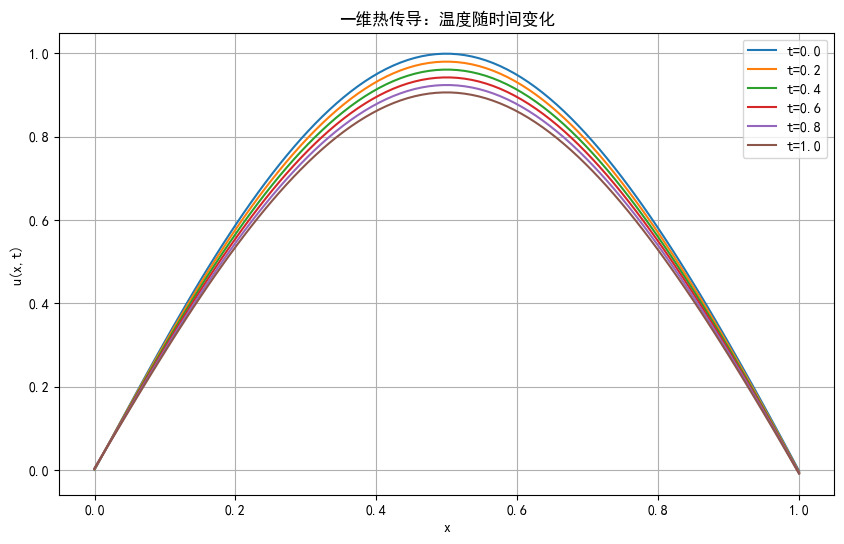

In [5]:
# 生成测试数据：空间 x ∈ [0, 1]，时间 t = 0, 0.2, 0.4, 0.6, 0.8, 1.0
x = np.linspace(0, 1, 100).reshape(-1, 1)
ts = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]

# 在每个时刻 t，构造 (x, t) 测试点，预测温度 u(x,t)
plt.figure(figsize=(10, 6))
for t in ts:
    xt = np.hstack((x, np.full_like(x, t)))  # 构造 shape = (100, 2) 的输入
    u = model.predict(xt)
    plt.plot(x, u, label=f"t={t:.1f}")

plt.xlabel("x")
plt.ylabel("u(x,t)")
plt.title("一维热传导：温度随时间变化")
plt.legend()
plt.grid(True)
plt.show()


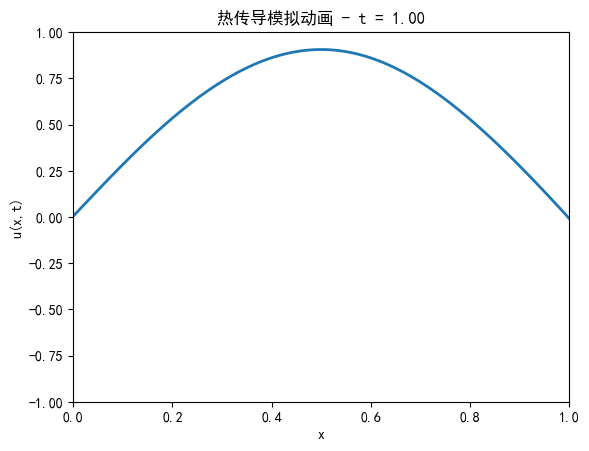

In [6]:
import matplotlib.animation as animation
from IPython.display import HTML

# 准备空间点
x = np.linspace(0, 1, 100).reshape(-1, 1)
times = np.linspace(0, 1, 100)  # 100 个时间点

# 创建画布和图形元素
fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
ax.set_xlim(0, 1)
ax.set_ylim(-1, 1)
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.set_title("热传导模拟动画")

# 初始化函数：清空画面
def init():
    line.set_data([], [])
    return line,

# 更新函数：每一帧预测新的温度曲线
def update(frame):
    t = times[frame]
    xt = np.hstack((x, np.full_like(x, t)))  # 构造 (x, t)
    u = model.predict(xt)
    line.set_data(x, u)
    ax.set_title(f"热传导模拟动画 - t = {t:.2f}")
    return line,

# 创建动画对象
ani = animation.FuncAnimation(
    fig, update, frames=len(times), init_func=init,
    blit=True, interval=100
)

# 在 Jupyter Notebook 中展示动画
HTML(ani.to_jshtml())

In [7]:
# 保存动画为 MP4 文件
ani.save("heat_equation_pinns.mp4", writer="ffmpeg", fps=20)

In [10]:
import matplotlib.pyplot as plt

# 从 data 中获取训练用的采样点
X_domain, _ = data.domain_points()       # PDE 方程区域采样点
X_initial, _ = data.initial_points()     # 初始条件采样点 (t = 0)
X_boundary, _ = data.boundary_points()   # 边界条件采样点 (x = 0 or 1)

# 绘图
plt.figure(figsize=(8, 6))
plt.scatter(X_domain[:, 0], X_domain[:, 1], s=10, c='blue', label='Domain Points (PDE)', alpha=0.5)
plt.scatter(X_initial[:, 0], X_initial[:, 1], s=30, c='red', label='Initial Points (t=0)')
plt.scatter(X_boundary[:, 0], X_boundary[:, 1], s=30, c='green', label='Boundary Points (x=0 or 1)')
plt.xlabel("x")
plt.ylabel("t")
plt.title("1D 热传导方程训练点可视化")
plt.legend()
plt.grid(True)
plt.show()


AttributeError: 'TimePDE' object has no attribute 'domain_points'

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# 获取所有训练点
X_all = model.data.train_x  # shape = (N, 2)，每一行为一个 [x, t] 点

# 获取标签（0=domain，1=boundary，2=initial）
# DeepXDE 会为每一类点单独编码
domain_idx = model.data.train_x_type == 0
boundary_idx = model.data.train_x_type == 1
initial_idx = model.data.train_x_type == 2

# 提取三类点
X_domain = X_all[domain_idx]
X_boundary = X_all[boundary_idx]
X_initial = X_all[initial_idx]

# 绘图
plt.figure(figsize=(8, 6))
plt.scatter(X_domain[:, 0], X_domain[:, 1], s=10, c='blue', label='Domain Points (PDE)', alpha=0.5)
plt.scatter(X_initial[:, 0], X_initial[:, 1], s=30, c='red', label='Initial Points (t=0)')
plt.scatter(X_boundary[:, 0], X_boundary[:, 1], s=30, c='green', label='Boundary Points (x=0 or 1)')
plt.xlabel("x")
plt.ylabel("t")
plt.title("1D 热传导方程训练点可视化")
plt.legend()
plt.grid(True)
plt.show()


AttributeError: 'TimePDE' object has no attribute 'train_x_type'

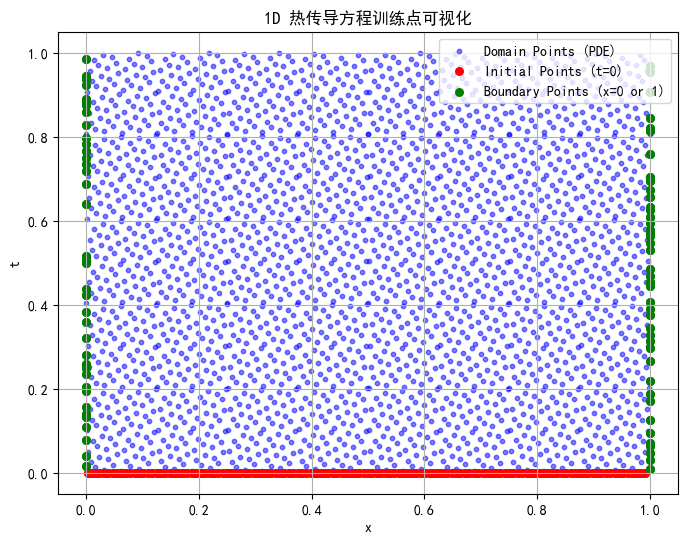

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# 所有训练点
X_all = model.data.train_x

# 设定判别阈值（处理浮点精度问题）
eps = 1e-6

# 初始点：t ≈ 0
initial_idx = np.abs(X_all[:, 1]) < eps

# 边界点：x ≈ 0 或 x ≈ 1
boundary_idx = (np.abs(X_all[:, 0]) < eps) | (np.abs(X_all[:, 0] - 1) < eps)

# domain 点 = 非初始 & 非边界
domain_idx = ~(initial_idx | boundary_idx)

# 提取各类点
X_initial = X_all[initial_idx]
X_boundary = X_all[boundary_idx]
X_domain = X_all[domain_idx]

# 绘图
plt.figure(figsize=(8, 6))
plt.scatter(X_domain[:, 0], X_domain[:, 1], s=10, c='blue', label='Domain Points (PDE)', alpha=0.5)
plt.scatter(X_initial[:, 0], X_initial[:, 1], s=30, c='red', label='Initial Points (t=0)')
plt.scatter(X_boundary[:, 0], X_boundary[:, 1], s=30, c='green', label='Boundary Points (x=0 or 1)')
plt.xlabel("x")
plt.ylabel("t")
plt.title("1D 热传导方程训练点可视化")
plt.legend()
plt.grid(True)
plt.show()


C:\Users\luoch\AppData\Local\Temp\ipykernel_8460\1130500069.py:32: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  cax.set_extent([0, 1, 0, t[frame]])


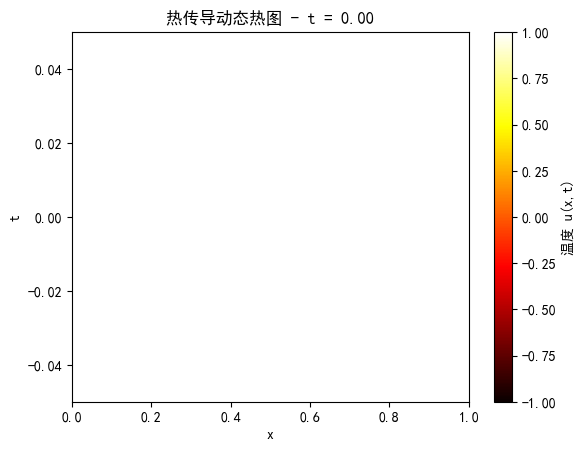

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 空间和时间划分
x = np.linspace(0, 1, 100)
t = np.linspace(0, 1, 100)
X, T = np.meshgrid(x, t)  # 构建网格（用于可视化）

# 初始化温度矩阵 u(x, t)
U = np.zeros_like(X)

# 预计算所有 u(x, t)
for i, t_val in enumerate(t):
    xt = np.hstack((x.reshape(-1, 1), np.full((100, 1), t_val)))
    u_pred = model.predict(xt).flatten()
    U[i, :] = u_pred  # 第 i 行是 t = t_val 时的所有 u(x)

# 创建动画
fig, ax = plt.subplots()
cax = ax.imshow(U[:1, :], extent=[0, 1, 0, t[1]], origin='lower',
                aspect='auto', cmap='hot', vmin=-1, vmax=1)
fig.colorbar(cax, label="温度 u(x,t)")
ax.set_xlabel("x")
ax.set_ylabel("t")
ax.set_title("热传导动态热图")

# 更新函数
def update(frame):
    cax.set_data(U[:frame+1, :])
    cax.set_extent([0, 1, 0, t[frame]])
    ax.set_title(f"热传导动态热图 - t = {t[frame]:.2f}")
    return [cax]

# 创建动画
ani = animation.FuncAnimation(fig, update, frames=len(t), interval=100, blit=False)

# 显示动画
HTML(ani.to_jshtml())


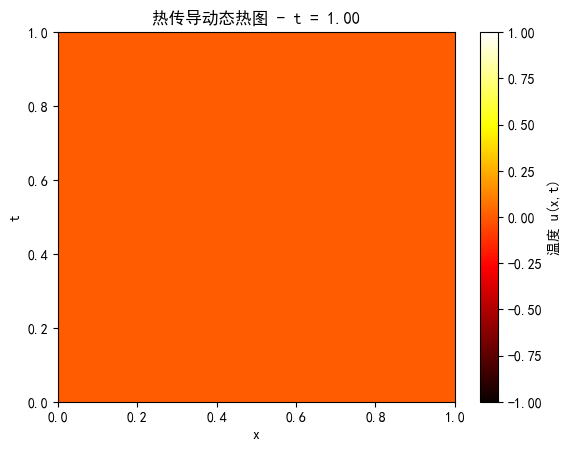

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 空间和时间划分
x = np.linspace(0, 1, 100)
t = np.linspace(0, 1, 100)
X, T = np.meshgrid(x, t)  # 网格用于构造完整矩阵

# 计算完整的温度矩阵 U(x, t)
U = np.zeros_like(X)
for i, t_val in enumerate(t):
    xt = np.hstack((x.reshape(-1, 1), np.full((len(x), 1), t_val)))
    u_pred = model.predict(xt).flatten()
    U[i, :] = u_pred  # 每一行代表某一时刻的 u(x)

# 创建图像
fig, ax = plt.subplots()
cax = ax.imshow(U, extent=[0, 1, 0, 1], origin='lower',
                aspect='auto', cmap='hot', vmin=-1, vmax=1)
fig.colorbar(cax, label="温度 u(x,t)")
ax.set_xlabel("x")
ax.set_ylabel("t")
ax.set_title("热传导动态热图")

# 初始化帧：显示第一帧
def init():
    cax.set_data(np.zeros_like(U))  # 全黑开始
    return [cax]

# 更新帧：每次显示到第 frame 行
def update(frame):
    U_display = np.copy(U)
    U_display[frame+1:, :] = np.nan  # 将未到的时间区域设为空
    cax.set_data(U_display)
    ax.set_title(f"热传导动态热图 - t = {t[frame]:.2f}")
    return [cax]

# 创建动画（坐标轴不变，仅内容更新）
ani = animation.FuncAnimation(fig, update, frames=len(t),
                              init_func=init, interval=100, blit=False)

# 显示动画
HTML(ani.to_jshtml())



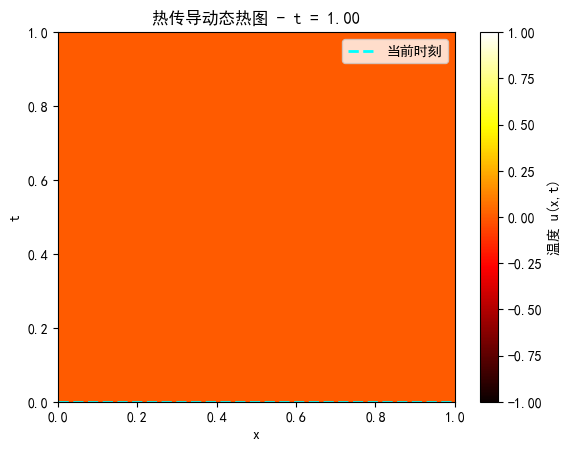

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# 1. 构造空间和时间网格
x = np.linspace(0, 1, 100)
t = np.linspace(0, 1, 100)
X, T = np.meshgrid(x, t)
U = np.zeros_like(X)

# 2. 使用模型预测生成 u(x, t)
for i, t_val in enumerate(t):
    xt = np.hstack((x.reshape(-1, 1), np.full((len(x), 1), t_val)))
    u_pred = model.predict(xt).flatten()
    U[i, :] = u_pred

# 3. 创建图像窗口
fig, ax = plt.subplots()
cax = ax.imshow(np.zeros_like(U), extent=[0, 1, 0, 1], origin='lower',
                aspect='auto', cmap='hot', vmin=-1, vmax=1)
colorbar = fig.colorbar(cax, label="温度 u(x,t)")

# 4. 添加追踪线（初始化在 t=0）
tracker_line = ax.axhline(y=0, color='cyan', linestyle='--', linewidth=2, label="当前时刻")
ax.legend(loc="upper right")

# 坐标轴标签
ax.set_xlabel("x")
ax.set_ylabel("t")
ax.set_title("热传导动态热图")

# 5. 初始化函数
def init():
    cax.set_data(np.zeros_like(U))  # 开始时全部为0
    tracker_line.set_ydata([0, 0])       # 初始化追踪线为 t=0 的横线
    return [cax, tracker_line]

# 6. 更新函数
def update(frame):
    U_display = np.copy(U)
    U_display[frame+1:, :] = np.nan  # 遮掉未到的时间帧
    cax.set_data(U_display)
    tracker_line.set_ydata([t[frame], t[frame]])  # 更新追踪线位置
    ax.set_title(f"热传导动态热图 - t = {t[frame]:.2f}")
    return [cax, tracker_line]

# 7. 创建动画
ani = animation.FuncAnimation(fig, update, frames=len(t),
                              init_func=init, interval=100, blit=False)

# 8. 显示动画
HTML(ani.to_jshtml())
